# California Housing Price Prediction

## Index:
1. Load dataset
2. Exploratory Data Analysis
3. Data preprocessing
4. Model training
5. Optimize model
6. Conclusion


## 1. Load dataset


### Import dataset

In [91]:
import kagglehub
camnugent_california_housing_prices_path = kagglehub.dataset_download('camnugent/california-housing-prices')

### Import Libraries

In [161]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import StratifiedShuffleSplit, train_test_split, cross_val_score, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder, FunctionTransformer
from sklearn.metrics import mean_squared_error, make_scorer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import rbf_kernel
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import make_column_selector, make_column_transformer, ColumnTransformer

import folium
from folium import Circle
from scipy.stats import randint

### Load dataset

In [93]:
data = pd.read_csv('/kaggle/input/california-housing-prices/housing.csv')

In [94]:
data.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [95]:
data.shape

(20640, 10)

In [96]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


### Feature's info
1. longitude: A measure of how far west a house is; a higher value is farther west

2. latitude: A measure of how far north a house is; a higher value is farther north

3. housingMedianAge: Median age of a house within a block; a lower number is a newer building

4. totalRooms: Total number of rooms within a block

5. totalBedrooms: Total number of bedrooms within a block

6. population: Total number of people residing within a block

7. households: Total number of households, a group of people residing within a home unit, for a block

8. medianIncome: Median income for households within a block of houses (measured in tens of thousands of US Dollars)

9. medianHouseValue: Median house value for households within a block (measured in US Dollars)

10. oceanProximity: Location of the house w.r.t ocean/sea

In [97]:
data['ocean_proximity'].value_counts()

,count
ocean_proximity,
<1H OCEAN,9136
INLAND,6551
NEAR OCEAN,2658
NEAR BAY,2290
ISLAND,5


In [98]:
data.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


Since housing_median_age and median_income are skewed, we discretize them into categorical bins to ensure proportional representation across all levels.

In [99]:
data['housing_age_cat'] = pd.cut(data['housing_median_age'], bins=[5, 10, 20, 30, 40 , 50], labels=[1, 2, 3, 4, 5])

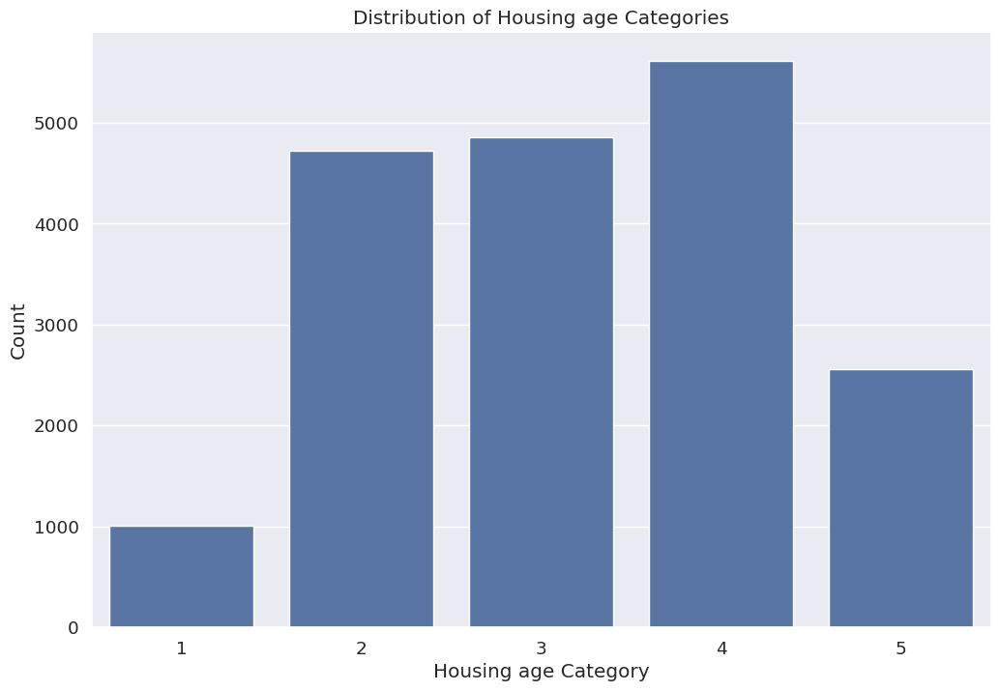

In [100]:
hac_count = data['housing_age_cat'].value_counts().sort_index()
sns.barplot(x=hac_count.index, y=hac_count.values)
plt.xlabel('Housing age Category')
plt.ylabel('Count')
plt.title('Distribution of Housing age Categories')
plt.show()

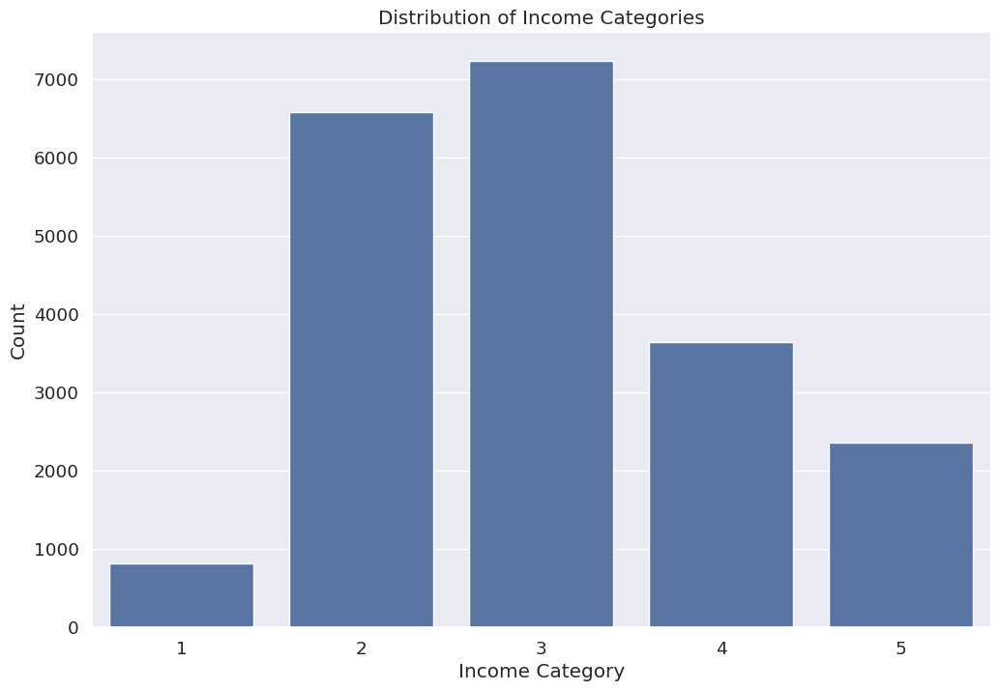

In [101]:
data['income_cat'] = pd.cut(data['median_income'], bins=[0, 1.5, 3, 4.5, 6, 20], labels=[1, 2, 3, 4, 5])
income_count = data['income_cat'].value_counts().sort_index()
sns.barplot(x=income_count.index, y=income_count.values)
plt.xlabel('Income Category')
plt.ylabel('Count')
plt.title('Distribution of Income Categories')
plt.show()

median_income has better distribution. Next, split the data based on income categories

In [102]:
splitter = StratifiedShuffleSplit(n_splits=10, test_size=0.2, random_state=42)

split_list = []
for i, j in splitter.split(data, data['income_cat']):
  train_set = data.iloc[i]
  test_set = data.iloc[j]
  split_list.append((train_set, test_set))

In [103]:
train, test = split_list[0]

In [104]:
train, test = train_test_split(data, test_size=0.2, random_state=42, stratify=data['income_cat'])
test['income_cat'].value_counts() / len(test)

,count
income_cat,
3,0.350533
2,0.318798
4,0.176357
5,0.114341
1,0.039971


In [105]:
for col in (train, test):
  col.drop('income_cat', axis=1, inplace=True)

### 2. Exploratory Data Analysis

In [106]:
data = train.copy()

In [107]:
numerical_col = data.select_dtypes(include=['int64', 'float64']).columns
categorical_col = data.select_dtypes(include=['object']).columns

print('Numerical features:', numerical_col)
print('Categorical features:', categorical_col)

Numerical features: Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value'],
      dtype='object')
Categorical features: Index(['ocean_proximity'], dtype='object')


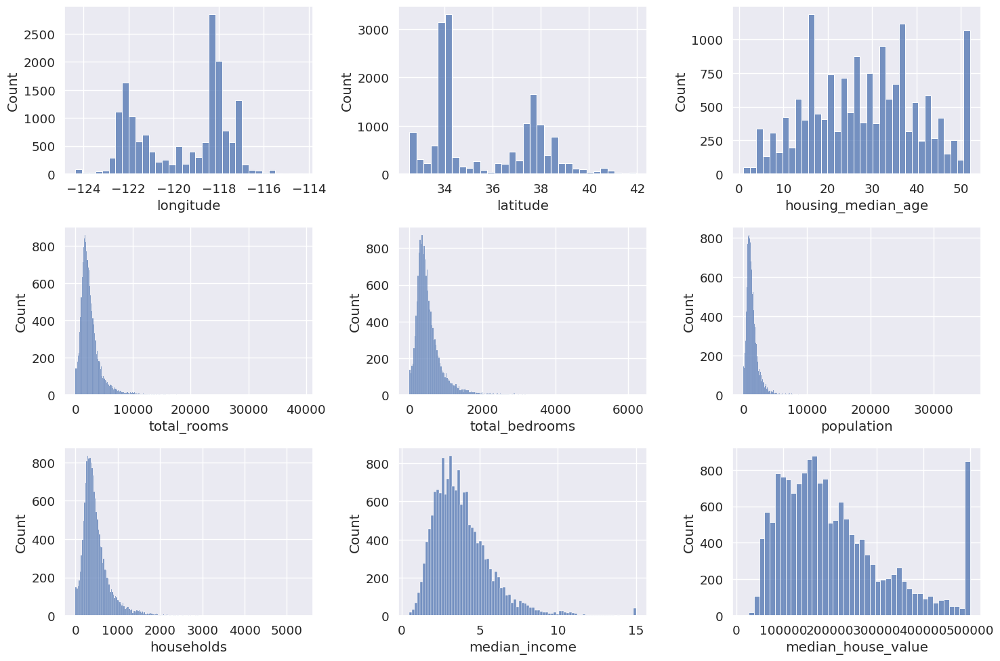

In [108]:
fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(15, 10))
for i, col in enumerate(numerical_col):
  sns.histplot(data[col], ax=ax[i//3, i%3])
  plt.tight_layout()

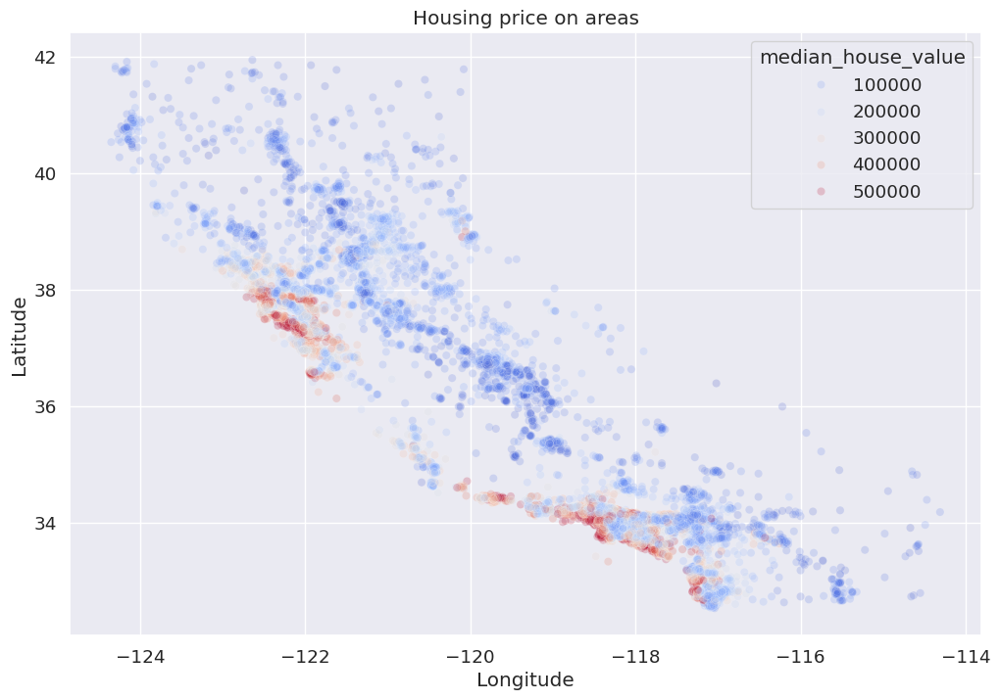

In [109]:
sns.set(rc={'figure.figsize': [12, 8]}, font_scale=1.2)
sns.scatterplot(x='longitude', y='latitude', data=data, hue='median_house_value', palette='coolwarm', alpha=0.2)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Housing price on areas')
plt.show()

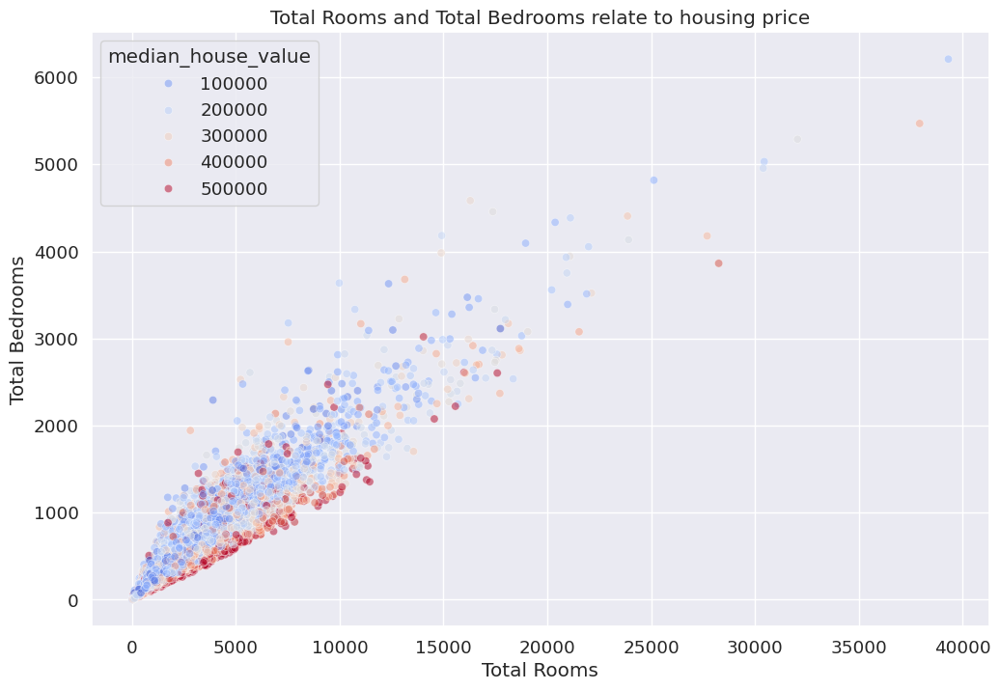

In [110]:
sns.scatterplot(x=data['total_rooms'], y=data['total_bedrooms'], hue=data['median_house_value'], palette='coolwarm', alpha=0.5)
plt.xlabel('Total Rooms')
plt.ylabel('Total Bedrooms')
plt.title('Total Rooms and Total Bedrooms relate to housing price')
plt.show()

Text(0.5, 1.0, 'Population and  housing price relation')

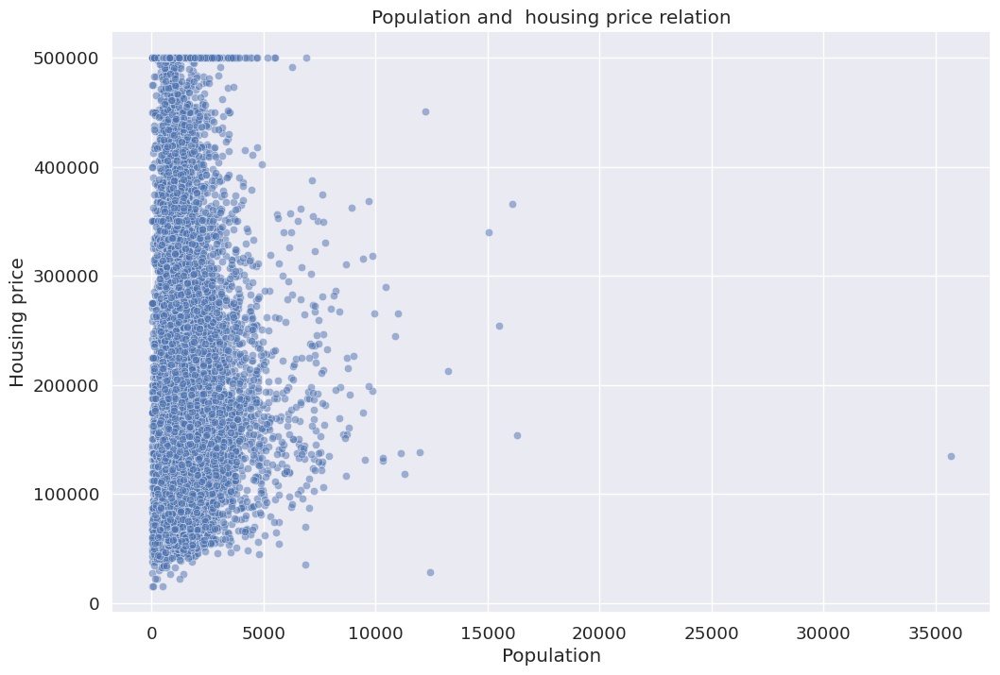

In [111]:
sns.scatterplot(x=data['population'], y=data['median_house_value'], palette='coolwarm', alpha=0.5)
plt.xlabel('Population')
plt.ylabel('Housing price')
plt.title('Population and  housing price relation')

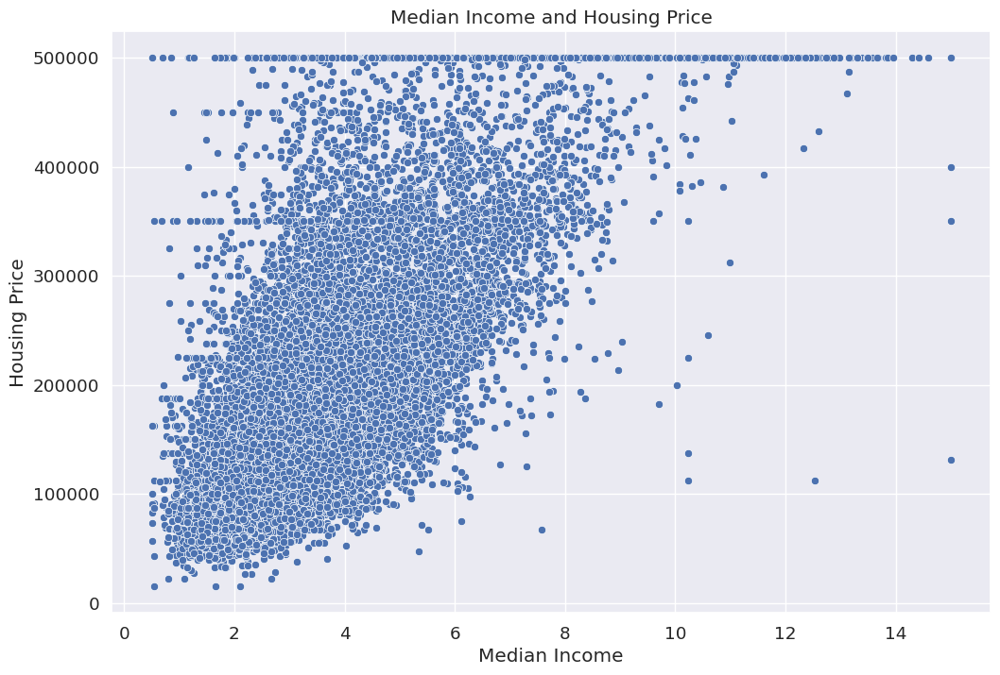

In [112]:
sns.scatterplot(x=data['median_income'], y=data['median_house_value'])
plt.title('Median Income and Housing Price')
plt.xlabel('Median Income')
plt.ylabel('Housing Price')
plt.show()

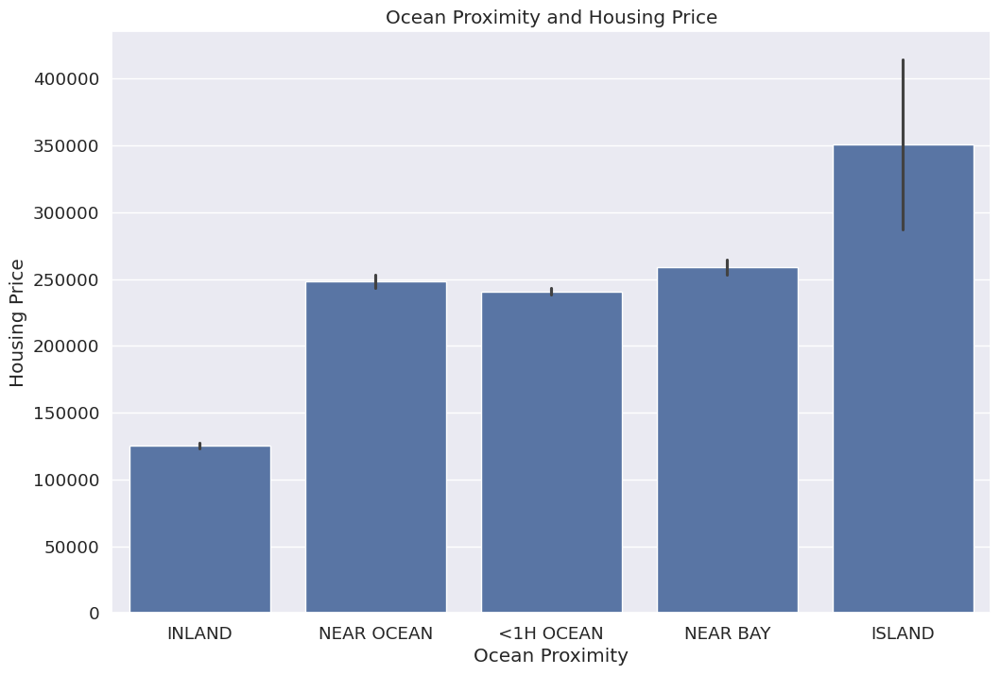

In [113]:
sns.barplot(x=data['ocean_proximity'], y=data['median_house_value'])
plt.title('Ocean Proximity and Housing Price')
plt.xlabel('Ocean Proximity')
plt.ylabel('Housing Price')
plt.show()

Correlation matrix

In [114]:
corr = data.corr(numeric_only=True)
corr['median_house_value'].sort_values(ascending=False)

,median_house_value
median_house_value,1.000000
median_income,0.687151
total_rooms,0.135140
housing_median_age,0.114146
households,0.064590
total_bedrooms,0.047781
population,-0.026882
longitude,-0.047466
latitude,-0.142673


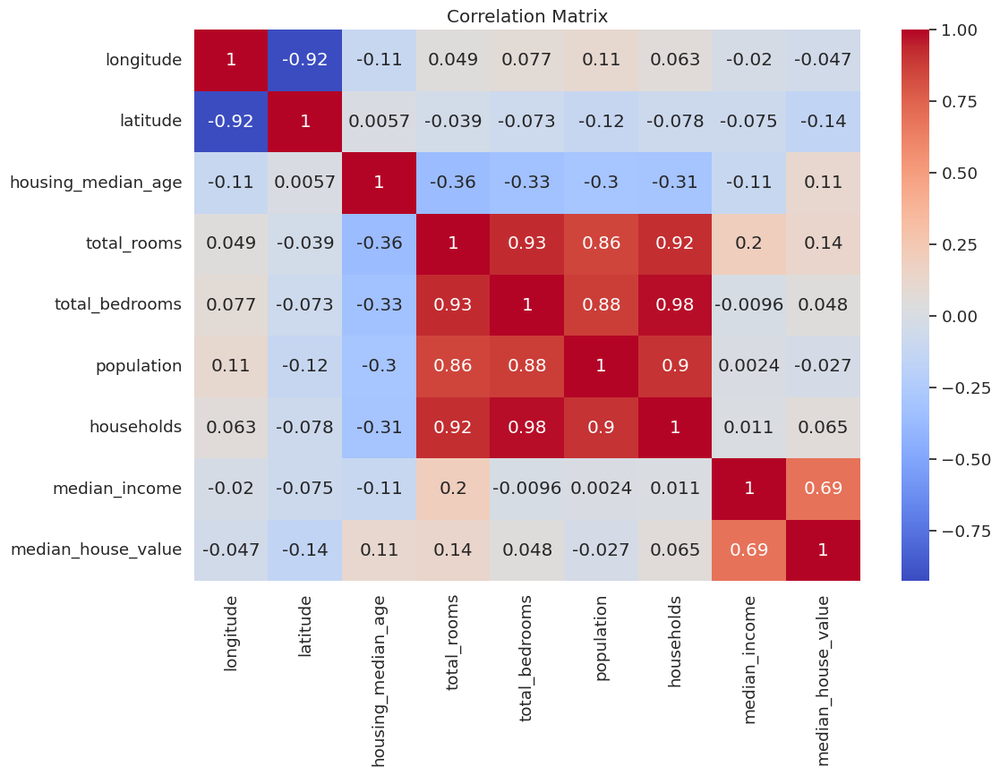

In [115]:
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', ax=ax)
plt.title('Correlation Matrix')
plt.show()

In [116]:
# ## Create new features
# data['rooms_per_house'] = data['total_rooms'] / data['households']
# data['bedroom_per_house'] = data['total_bedrooms'] / data['total_rooms']
# data['person_per_house'] = data['population'] / data['households']
# data['income_per_area'] = data['median_income'] * data['households']

# ## Do the same for test set
# test['rooms_per_house'] = test['total_rooms'] / test['households']
# test['bedroom_per_house'] = test['total_bedrooms'] / test['total_rooms']
# test['person_per_house'] = test['population'] / test['households']
# test['income_per_area'] = test['median_income'] * test['households']

## 3. Data Preprocessing

check missing value

In [117]:
data.isnull().sum()

,0
longitude,0
latitude,0
housing_median_age,0
total_rooms,0
total_bedrooms,158
population,0
households,0
median_income,0
median_house_value,0
ocean_proximity,0


In [118]:
x = data.drop('median_house_value', axis=1)
y = data['median_house_value'].copy()

In [119]:
x

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,housing_age_cat
12655,-121.46,38.52,29.0,3873.0,797.0,2237.0,706.0,2.1736,INLAND,3
15502,-117.23,33.09,7.0,5320.0,855.0,2015.0,768.0,6.3373,NEAR OCEAN,1
2908,-119.04,35.37,44.0,1618.0,310.0,667.0,300.0,2.8750,INLAND,5
14053,-117.13,32.75,24.0,1877.0,519.0,898.0,483.0,2.2264,NEAR OCEAN,3
20496,-118.70,34.28,27.0,3536.0,646.0,1837.0,580.0,4.4964,<1H OCEAN,3
...,...,...,...,...,...,...,...,...,...,...
15174,-117.07,33.03,14.0,6665.0,1231.0,2026.0,1001.0,5.0900,<1H OCEAN,2
12661,-121.42,38.51,15.0,7901.0,1422.0,4769.0,1418.0,2.8139,INLAND,2
19263,-122.72,38.44,48.0,707.0,166.0,458.0,172.0,3.1797,<1H OCEAN,5
19140,-122.70,38.31,14.0,3155.0,580.0,1208.0,501.0,4.1964,<1H OCEAN,2


In [120]:
y

,median_house_value
12655,72100.0
15502,279600.0
2908,82700.0
14053,112500.0
20496,238300.0
...,...
15174,268500.0
12661,90400.0
19263,140400.0
19140,258100.0


#### Create new features

In [121]:
x_temp = x.copy()

# number of rooms in a household
x_temp['rooms_per_house'] = x_temp['total_rooms'] / x_temp['households']

# bedroom's ratio per room
x_temp['bedroom_per_house'] = x_temp['total_bedrooms'] / x_temp['total_rooms']

# number of people in a household
x_temp['person_per_house'] = x_temp['population'] / x_temp['households']

# income of households
x_temp['income_per_area'] = x_temp['median_income'] * x_temp['households']

In [122]:
x_temp.head(5)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,housing_age_cat,rooms_per_house,bedroom_per_house,person_per_house,income_per_area
12655,-121.46,38.52,29.0,3873.0,797.0,2237.0,706.0,2.1736,INLAND,3,5.485836,0.205784,3.168555,1534.5616
15502,-117.23,33.09,7.0,5320.0,855.0,2015.0,768.0,6.3373,NEAR OCEAN,1,6.927083,0.160714,2.623698,4867.0464
2908,-119.04,35.37,44.0,1618.0,310.0,667.0,300.0,2.8750,INLAND,5,5.393333,0.191595,2.223333,862.5000
14053,-117.13,32.75,24.0,1877.0,519.0,898.0,483.0,2.2264,NEAR OCEAN,3,3.886128,0.276505,1.859213,1075.3512
20496,-118.70,34.28,27.0,3536.0,646.0,1837.0,580.0,4.4964,<1H OCEAN,3,6.096552,0.182692,3.167241,2607.9120


#### Clustering similarity based on coordinates

Use Kmean and RBF to convert latitude and longitude into similar points, reflects the proximity of a house to identified location clusters. This approach helps the model better capture location-based pricing patterns.


In [123]:
class ClusterSimi(BaseEstimator, TransformerMixin):
  def __init__(self, n_clusters=10, gamma=1.0, random_state=None):
    self.n_clusters = n_clusters
    self.gamma = gamma
    self.random_state = random_state
  def fit(self, x, y=None, sample_weight=None):
    self.kmeans = KMeans(self.n_clusters,
                         n_init=10,
                         random_state=self.random_state)
    self.kmeans.fit(x, sample_weight=sample_weight)
    return self
  def transform(self, x):
    return rbf_kernel(x, self.kmeans.cluster_centers_, gamma=self.gamma)
  def get_feature_names_out(self, input_features=None):
    return [f"Cluster {i} similarity" for i in range(self.n_clusters)]

In [124]:
cluster = ClusterSimi(n_clusters=10, gamma=1.0, random_state=42)
simi= cluster.fit_transform(x[['longitude', 'latitude']], sample_weight=y)

In [125]:
simi[:3].round(2)

array([[0.  , 0.31, 0.  , 0.85, 0.  , 0.  , 0.  , 0.  , 0.16, 0.49],
       [0.11, 0.  , 0.  , 0.  , 0.94, 0.  , 0.  , 0.41, 0.  , 0.  ],
       [0.11, 0.  , 0.15, 0.  , 0.  , 0.37, 0.  , 0.02, 0.  , 0.  ]])

In [126]:
# select features for clustering
cluster_features = x[["median_income", "housing_median_age", "total_rooms", "population", "households"]]

# clustering
cluster_simi = ClusterSimi(n_clusters=10, gamma=1.0, random_state=42)
similarities= cluster_simi.fit_transform(cluster_features)

# create DataFrame for similarites
simi_df = pd.DataFrame(similarities, columns=cluster_simi.get_feature_names_out())
simi_df['lat'] = x['latitude']
simi_df['lon'] = x['longitude']

Visualize clustering map

In [127]:
# take max similarity to visualize strongest affiliation
simi_df['max_simi'] = simi_df[cluster_simi.get_feature_names_out()].max(axis=1)

# drop rows with NaN values
simi_df = simi_df.dropna(subset=['lat', 'lon'])

# create map around latitude/longtitude
map = folium.Map(location=[simi_df['lat'].mean(), simi_df['lon'].mean()], zoom_start=10)

# add points
for i, row in simi_df.iterrows():
  Circle(location=[row['lat'], row['lon']], radius=20, color='blue', fill=True, fill_opacity=0.5).add_to(map)
map

### Create PipeLines

numerical features

In [128]:
num_pipeline = make_pipeline(
    SimpleImputer(strategy='median'),
    StandardScaler()
)

In [129]:
num_pipeline

Pipeline(steps=[('simpleimputer', SimpleImputer(strategy='median')),
                ('standardscaler', StandardScaler())])

In [130]:
x_num = x.select_dtypes(include=[np.number])
x_trans = num_pipeline.fit_transform(x_num)
x_trans

array([[-0.94135046,  1.34743822,  0.02756357, ...,  0.73260236,
         0.55628602, -0.8936472 ],
       [ 1.17178212, -1.19243966, -1.72201763, ...,  0.53361152,
         0.72131799,  1.292168  ],
       [ 0.26758118, -0.1259716 ,  1.22045984, ..., -0.67467519,
        -0.52440722, -0.52543365],
       ...,
       [-1.5707942 ,  1.31001828,  1.53856552, ..., -0.86201341,
        -0.86511838, -0.36547546],
       [-1.56080303,  1.2492109 , -1.1653327 , ..., -0.18974707,
         0.01061579,  0.16826095],
       [-1.28105026,  2.02567448, -0.13148926, ..., -0.71232211,
        -0.79857323, -0.390569  ]])

In [131]:
x_trans_df = pd.DataFrame(x_trans, columns=num_pipeline.get_feature_names_out(), index=x_num.index)
x_trans_df.head(5)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income
12655,-0.941350,1.347438,0.027564,0.584777,0.640371,0.732602,0.556286,-0.893647
15502,1.171782,-1.192440,-1.722018,1.261467,0.781561,0.533612,0.721318,1.292168
2908,0.267581,-0.125972,1.220460,-0.469773,-0.545138,-0.674675,-0.524407,-0.525434
14053,1.221738,-1.351474,-0.370069,-0.348652,-0.036367,-0.467617,-0.037297,-0.865929
20496,0.437431,-0.635818,-0.131489,0.427179,0.272790,0.374060,0.220898,0.325752


Categorical features

In [132]:
cat_pipeline = make_pipeline(
    SimpleImputer(strategy='most_frequent'),
    OneHotEncoder(handle_unknown='ignore')
)
cat_pipeline

Pipeline(steps=[('simpleimputer', SimpleImputer(strategy='most_frequent')),
                ('onehotencoder', OneHotEncoder(handle_unknown='ignore'))])

In [133]:
x_cat = x.select_dtypes(include=['object'])
x_cat_trans = cat_pipeline.fit_transform(x_cat)

In [134]:
x_cat_trans_df = pd.DataFrame(x_cat_trans.toarray(), columns=cat_pipeline.get_feature_names_out(), index=x_cat.index)
x_cat_trans_df.head(5)

,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
12655,0.0,1.0,0.0,0.0,0.0
15502,0.0,0.0,0.0,0.0,1.0
2908,0.0,1.0,0.0,0.0,0.0
14053,0.0,0.0,0.0,0.0,1.0
20496,1.0,0.0,0.0,0.0,0.0


Merge 2 pipelines into 1

In [135]:
prepocessing = make_column_transformer(
    (num_pipeline, make_column_selector(dtype_include=np.number)),
    (cat_pipeline, make_column_selector(dtype_include=object))
)

x_pre = prepocessing.fit_transform(x)
x_pre_df = pd.DataFrame(x_pre,
                        columns=prepocessing.get_feature_names_out(),
                        index=x.index)
x_pre_df.head(5)

,pipeline-1__longitude,pipeline-1__latitude,pipeline-1__housing_median_age,pipeline-1__total_rooms,pipeline-1__total_bedrooms,pipeline-1__population,pipeline-1__households,pipeline-1__median_income,pipeline-2__ocean_proximity_<1H OCEAN,pipeline-2__ocean_proximity_INLAND,pipeline-2__ocean_proximity_ISLAND,pipeline-2__ocean_proximity_NEAR BAY,pipeline-2__ocean_proximity_NEAR OCEAN
12655,-0.941350,1.347438,0.027564,0.584777,0.640371,0.732602,0.556286,-0.893647,0.0,1.0,0.0,0.0,0.0
15502,1.171782,-1.192440,-1.722018,1.261467,0.781561,0.533612,0.721318,1.292168,0.0,0.0,0.0,0.0,1.0
2908,0.267581,-0.125972,1.220460,-0.469773,-0.545138,-0.674675,-0.524407,-0.525434,0.0,1.0,0.0,0.0,0.0
14053,1.221738,-1.351474,-0.370069,-0.348652,-0.036367,-0.467617,-0.037297,-0.865929,0.0,0.0,0.0,0.0,1.0
20496,0.437431,-0.635818,-0.131489,0.427179,0.272790,0.374060,0.220898,0.325752,1.0,0.0,0.0,0.0,0.0


#### Combine all preprocessing step:
 - new features (room_per_households, ...)
 - feature scaling: use log scaling to handle feature with large values, handle skewed data.
 - clustering: geo-based features using KMeans and RBF

 - ColumnsTranformer: merge all step into 1 pipeline

In [136]:
def col_ratio(x):
  return x[:, [0]] / x[:, [1]]

def col_mul(x):
  return x[:, [0]] * x[:, [1]]

def ratio_feature(_, feature_name):
  return ["ratio"]

def ratio_pipeline():
  return make_pipeline(
      SimpleImputer(strategy="median"),
      FunctionTransformer(col_ratio, feature_names_out=ratio_feature),
      StandardScaler()
  )

def mul_pipeline():
  return make_pipeline(
      SimpleImputer(strategy="median"),
      FunctionTransformer(col_mul, feature_names_out=ratio_feature),
      StandardScaler()
  )

log_pipeline = make_pipeline(
    SimpleImputer(strategy="median"),
    FunctionTransformer(np.log, feature_names_out="one-to-one"),
    StandardScaler()
)

default_pipeline = make_pipeline(
    SimpleImputer(strategy='median'),
    StandardScaler()
)

preprocessing = ColumnTransformer([
    ("rooms_per_house", ratio_pipeline(), ['total_rooms', 'households']),
    ("bedrom_per_house", ratio_pipeline(), ['total_bedrooms', 'total_rooms']),
    ("person_per_house", ratio_pipeline(), ['population', 'households']),
    ("income_per_area", mul_pipeline(), ['median_income', 'households']),
    ("log", log_pipeline, ["total_bedrooms", "total_rooms", "population", "households", "median_income"]),
    ("geo", cluster_simi, ['latitude', 'longitude']),
    ("cat", cat_pipeline, make_column_selector(dtype_include=object)),
], remainder=default_pipeline)

In [137]:
x_prepared = preprocessing.fit_transform(x)
x_prepared.shape

(16512, 26)

In [138]:
preprocessing.get_feature_names_out()

array(['rooms_per_house__ratio', 'bedrom_per_house__ratio',
       'person_per_house__ratio', 'income_per_area__ratio',
       'log__total_bedrooms', 'log__total_rooms', 'log__population',
       'log__households', 'log__median_income',
       'geo__Cluster 0 similarity', 'geo__Cluster 1 similarity',
       'geo__Cluster 2 similarity', 'geo__Cluster 3 similarity',
       'geo__Cluster 4 similarity', 'geo__Cluster 5 similarity',
       'geo__Cluster 6 similarity', 'geo__Cluster 7 similarity',
       'geo__Cluster 8 similarity', 'geo__Cluster 9 similarity',
       'cat__ocean_proximity_<1H OCEAN', 'cat__ocean_proximity_INLAND',
       'cat__ocean_proximity_ISLAND', 'cat__ocean_proximity_NEAR BAY',
       'cat__ocean_proximity_NEAR OCEAN', 'remainder__housing_median_age',
       'remainder__housing_age_cat'], dtype=object)

In [139]:
x_prepared_df = pd.DataFrame(x_prepared, columns=preprocessing.get_feature_names_out(), index=x.index)

x_prepared_df.head(5)

,rooms_per_house__ratio,bedrom_per_house__ratio,person_per_house__ratio,income_per_area__ratio,log__total_bedrooms,log__total_rooms,log__population,log__households,log__median_income,geo__Cluster 0 similarity,...,geo__Cluster 7 similarity,geo__Cluster 8 similarity,geo__Cluster 9 similarity,cat__ocean_proximity_<1H OCEAN,cat__ocean_proximity_INLAND,cat__ocean_proximity_ISLAND,cat__ocean_proximity_NEAR BAY,cat__ocean_proximity_NEAR OCEAN,remainder__housing_median_age,remainder__housing_age_cat
12655,0.017395,-0.121122,0.006223,-0.213199,0.873403,0.852032,0.938249,0.797843,-0.998832,3.371781e-14,...,5.849548e-08,4.706064e-01,3.412655e-01,0.0,1.0,0.0,0.0,0.0,0.027564,-0.179355
15502,0.569256,-0.810867,-0.040811,1.564890,0.970407,1.277433,0.796538,0.913214,1.277742,1.685796e-01,...,1.303571e-04,1.850749e-16,3.130344e-22,0.0,0.0,0.0,0.0,1.0,-1.722018,-2.041358
2908,-0.018024,-0.338273,-0.075371,-0.571786,-0.430559,-0.317644,-0.702499,-0.375177,-0.403837,7.630390e-02,...,5.485368e-01,6.391756e-05,2.741731e-08,0.0,1.0,0.0,0.0,0.0,1.220460,1.682647
14053,-0.595140,0.961205,-0.106803,-0.458217,0.281063,-0.118663,-0.299288,0.277558,-0.947769,6.588852e-02,...,2.118053e-05,3.147969e-18,3.670625e-24,0.0,0.0,0.0,0.0,1.0,-0.370069,-0.179355
20496,0.251241,-0.474513,0.006109,0.359500,0.583337,0.730040,0.671139,0.528397,0.547635,7.243267e-01,...,2.954243e-01,2.354275e-08,2.910018e-12,1.0,0.0,0.0,0.0,0.0,-0.131489,-0.179355


## 4. Training Model

In [140]:
def root_mean_squared_error(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

rmse_scorer = make_scorer(root_mean_squared_error, greater_is_better=False)

#### 1. Linear Regression

In [141]:
from sklearn.linear_model import LinearRegression

linear_reg = make_pipeline(preprocessing, LinearRegression())
linear_reg.fit(x, y)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder=Pipeline(steps=[('simpleimputer',
                                                              SimpleImputer(strategy='median')),
                                                             ('standardscaler',
                                                              StandardScaler())]),
                                   transformers=[('rooms_per_house',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('functiontransformer',
                                                                   FunctionTransformer(feature_names_out=<function ratio_feat...
                                                   'households',
                                                   'median_income']),
                                                 ('geo',
                                                  ClusterSimi(random_state=42),
                                                  ['latitude', 'longitude']),
                                                 ('cat',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7ee2fa0d2d90>)])),
                ('linearregression', LinearRegression())])

In [142]:
y_pred = linear_reg.predict(x)
linear_rmse = root_mean_squared_error(y, y_pred)
linear_rmse

np.float64(68410.19027505683)

In [143]:
linear_cv = -cross_val_score(linear_reg, x, y, cv=5, scoring=rmse_scorer)
pd.Series(linear_cv).describe()

,0
count,5.000000
mean,70595.258855
std,4607.166313
min,67034.649248
25%,68735.064951
50%,69191.987399
75%,69342.937152
max,78671.655526


#### 2. K Nearest Neighbors

In [144]:
from sklearn.neighbors import KNeighborsRegressor

knn_reg = make_pipeline(preprocessing, KNeighborsRegressor(n_neighbors=5))
knn_reg.fit(x, y)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder=Pipeline(steps=[('simpleimputer',
                                                              SimpleImputer(strategy='median')),
                                                             ('standardscaler',
                                                              StandardScaler())]),
                                   transformers=[('rooms_per_house',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('functiontransformer',
                                                                   FunctionTransformer(feature_names_out=<function ratio_feat...
                                                   'median_income']),
                                                 ('geo',
                                                  ClusterSimi(random_state=42),
                                                  ['latitude', 'longitude']),
                                                 ('cat',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7ee2fa0d2d90>)])),
                ('kneighborsregressor', KNeighborsRegressor())])

In [145]:
y_pred = knn_reg.predict(x)
knn_rmse = root_mean_squared_error(y, y_pred)
knn_rmse

np.float64(49570.33918115537)

In [146]:
knn_cv = -cross_val_score(knn_reg, x, y, cv=5, scoring=rmse_scorer)
pd.Series(knn_cv).describe()

,0
count,5.000000
mean,62390.235980
std,1238.149622
min,61108.847756
25%,61240.495629
50%,62308.804946
75%,63596.065902
max,63696.965668


#### 3. Random Forest

In [147]:
from sklearn.ensemble import RandomForestRegressor

forest_reg = make_pipeline(preprocessing, RandomForestRegressor(random_state=42))
forest_reg.fit(x, y)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder=Pipeline(steps=[('simpleimputer',
                                                              SimpleImputer(strategy='median')),
                                                             ('standardscaler',
                                                              StandardScaler())]),
                                   transformers=[('rooms_per_house',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('functiontransformer',
                                                                   FunctionTransformer(feature_names_out=<function ratio_feat...
                                                 ('geo',
                                                  ClusterSimi(random_state=42),
                                                  ['latitude', 'longitude']),
                                                 ('cat',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7ee2fa0d2d90>)])),
                ('randomforestregressor',
                 RandomForestRegressor(random_state=42))])

In [148]:
y_pred = forest_reg.predict(x)
forest_rmse = root_mean_squared_error(y ,y_pred)
forest_rmse

np.float64(17557.48569912233)

In [149]:
forest_cv = -cross_val_score(forest_reg, x, y, cv=5, scoring=rmse_scorer)
pd.Series(forest_cv).describe()

,0
count,5.000000
mean,47731.658226
std,919.627400
min,46470.511794
25%,47185.492133
50%,47814.647164
75%,48577.427772
max,48610.212268


## 5. Optimize Model

Hyperparameter tuning for Random Forest using RandomizedSearchCV

In [150]:
model_pipeline = Pipeline([
    ("preprocessing", preprocessing),
    ("r_f", RandomForestRegressor(random_state=42)),
])

# Hyperparameter Tuning using RandomizedSearchCV

param_dist = {
    'preprocessing__geo__n_clusters': randint(3, 50), # number of cluster
    'r_f__n_estimators': randint(50, 150),            # number of tree
    'r_f__max_features': randint(2, 20),              # max features per split
    'r_f__max_depth': randint(5, 30),                 # depth of each tree
    'r_f__min_samples_split': randint(2, 10),         # min samples to split a node
    'r_f__min_samples_leaf': randint(1, 10),          # min samples in a leaf node
}

random_search = RandomizedSearchCV(
    model_pipeline,
    param_distributions=param_dist,
    n_iter=30,
    cv=5,
    scoring='neg_root_mean_squared_error',
    random_state=42,
    n_jobs=-1
)

random_search.fit(x, y)

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('preprocessing',
                                              ColumnTransformer(remainder=Pipeline(steps=[('simpleimputer',
                                                                                           SimpleImputer(strategy='median')),
                                                                                          ('standardscaler',
                                                                                           StandardScaler())]),
                                                                transformers=[('rooms_per_house',
                                                                               Pipeline(steps=[('simpleimputer',
                                                                                                SimpleImputer(strategy='median')),
                                                                                               ('functiontransformer',
                                                                                                FunctionTransformer(feature...
                                        'r_f__min_samples_leaf': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7ee2f31c1c10>,
                                        'r_f__min_samples_split': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7ee2f9f35a10>,
                                        'r_f__n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7ee2f9f37a10>},
                   random_state=42, scoring='neg_root_mean_squared_error')

In [151]:
random_search.best_params_

{'preprocessing__geo__n_clusters': 35,
 'r_f__max_depth': 20,
 'r_f__max_features': 6,
 'r_f__min_samples_leaf': 3,
 'r_f__min_samples_split': 5,
 'r_f__n_estimators': 135}

In [152]:
-random_search.best_score_

np.float64(43106.902717981604)

In [153]:
random_search.best_estimator_

Pipeline(steps=[('preprocessing',
                 ColumnTransformer(remainder=Pipeline(steps=[('simpleimputer',
                                                              SimpleImputer(strategy='median')),
                                                             ('standardscaler',
                                                              StandardScaler())]),
                                   transformers=[('rooms_per_house',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('functiontransformer',
                                                                   FunctionTransformer(feature_names_out=<function ratio_feature a...
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7ee2f9521210>)])),
                ('r_f',
                 RandomForestRegressor(max_depth=20, max_features=6,
                                       min_samples_leaf=3, min_samples_split=5,
                                       n_estimators=135, random_state=42))])

### Save final model with preprocessing steps and best paramters

In [154]:
final_model = random_search.best_estimator_

In [155]:
random_search.best_estimator_['r_f']

RandomForestRegressor(max_depth=20, max_features=6, min_samples_leaf=3,
                      min_samples_split=5, n_estimators=135, random_state=42)

### Find important features

In [156]:
feature_importances = final_model['r_f'].feature_importances_
feature_importances.round(5)

array([0.05891, 0.06101, 0.04383, 0.03497, 0.00475, 0.00467, 0.00768,
       0.00579, 0.169  , 0.01573, 0.01038, 0.01112, 0.00881, 0.01241,
       0.01288, 0.00769, 0.00988, 0.02642, 0.00603, 0.01209, 0.01582,
       0.00696, 0.02565, 0.01615, 0.02014, 0.01353, 0.02362, 0.01015,
       0.01924, 0.01674, 0.01334, 0.01264, 0.02561, 0.01029, 0.01724,
       0.01991, 0.01488, 0.02321, 0.00875, 0.01381, 0.01184, 0.00831,
       0.01345, 0.02023, 0.00433, 0.07415, 0.     , 0.00061, 0.00269,
       0.00944, 0.00325])

In [157]:
fi = pd.DataFrame({'feature': final_model['preprocessing'].get_feature_names_out(),
                   "importances (%)": feature_importances})
fi = fi.sort_values(by='importances (%)', ascending=False)
fi['importances (%)'] = fi['importances (%)']*100
fi.head(10)

,feature,importances (%)
8,log__median_income,16.900333
45,cat__ocean_proximity_INLAND,7.415035
1,bedrom_per_house__ratio,6.100546
0,rooms_per_house__ratio,5.890824
2,person_per_house__ratio,4.382941
3,income_per_area__ratio,3.496620
17,geo__Cluster 8 similarity,2.641673
22,geo__Cluster 13 similarity,2.565015
32,geo__Cluster 23 similarity,2.560570
26,geo__Cluster 17 similarity,2.361679


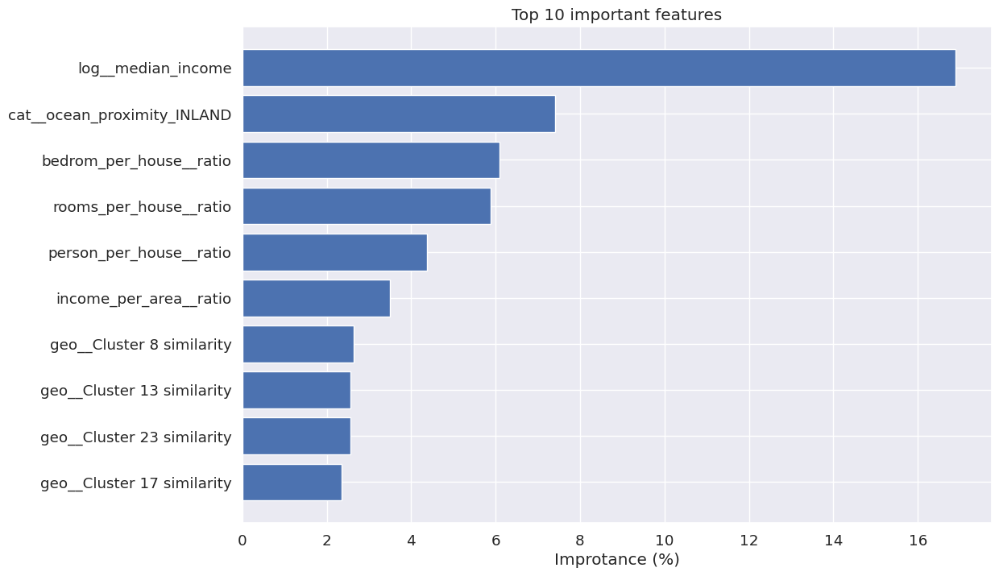

In [158]:
fi_ten = fi.head(10).sort_values(by='importances (%)', ascending=True)
plt.barh(fi_ten['feature'], fi_ten['importances (%)'])
plt.xlabel('Improtance (%)')
plt.title('Top 10 important features')
plt.show()

### Use final model on test set

In [159]:
x_test = test.drop('median_house_value', axis=1)
y_test = test['median_house_value'].copy()

y_test_pred = final_model.predict(x_test)
test_rmse = root_mean_squared_error(y_test, y_test_pred)
test_rmse

np.float64(40759.50149669726)

In [160]:
def bootstrap_rmse(y_true, y_pred, n_bootstrap=1000, confidence=0.95):
    n = len(y_true)
    rmses = []

    y_pred = np.array(y_pred)
    for _ in range(n_bootstrap):
        idx = np.random.choice(n, n, replace=True)
        rmse = np.sqrt(np.mean((y_pred[idx] - y_true.iloc[idx])**2))
        rmses.append(rmse)
    lower = np.percentile(rmses, (1 - confidence) / 2 * 100)
    upper = np.percentile(rmses, (1 + confidence) / 2 * 100)
    return (lower, upper)

interval = bootstrap_rmse(y_test, y_test_pred)
print(interval)

(np.float64(38810.52195606036), np.float64(42704.84493353496))


## 6. Conclusion

1. Model training

Use Random Forest give us better prediction, base on Cross-Validated RMSE:
- Linear Regression: 	70595
- K Nearest Neighbors: 62390
- Random Forest : 47731

After optimize Random Forest using hyperparameter tuning, reduce RMSE from 47731 to 42746.

---
2. Feature importances

Top 3 important features:
- median_income
- house inland
- bedroom per house

---
3. Model performance on Test set

Use Random Forest after tuning on test set with RMSE: ~ 40705

---
4. Evaluate

Random forest performs better and generalizes good informations due to:

1. Stratified sampling
2. Feature engineering: new features, ratios, clusters, logs
3. Hyperparameter tuning